In [7]:
# Project Outline

#1. **Introduction**
#    * Provide a brief overview of the project and its objectives.
#    * Highlight the importance of analyzing sales data to gain insights and improve business performance.

#2. **Data Exploration and Cleaning**
#    * Describe the data sources used in the project, including customer and sales data.
#    * Explain the data cleaning process, including handling missing values and outliers.

#3. **Data Analysis**
#    * Present key findings from the data analysis, such as the most profitable items, malls, and customer segments.
#    * Visualize the data using charts and graphs to illustrate the findings.

#4. **Modeling**
#    * Explain the use of the ARIMA model to forecast future sales.
#    * Discuss the limitations and assumptions of the model.

#5. **Conclusions and Recommendations**
#    * Summarize the key insights and conclusions from the project.
#    * Provide specific recommendations for improving sales and marketing strategies based on the analysis results.

# Introduction

#This project aims to analyze sales data from a retail company to gain insights into customer behavior, identify profitable items and malls, and forecast future sales.
#By understanding these patterns, the company can make informed decisions to improve its marketing strategies and increase revenue.

#The data used in this project includes customer and sales data, which were merged to create a comprehensive dataset.
#The data cleaning process involved handling missing values, outliers, and ensuring data integrity.


In [8]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots

In [9]:
customer = pd.read_csv('/content/sales_customers_data/customer_data.csv')
sales = pd.read_csv('/content/sales_customers_data/sales_data.csv')

In [10]:
customer.head()

,customer_id,gender,age,payment_method
0,C241288,Female,28.0,Credit Card
1,C111565,Male,21.0,Debit Card
2,C266599,Male,20.0,Cash
3,C988172,Female,66.0,Credit Card
4,C189076,Female,53.0,Cash


In [11]:
sales.head()

,invoice_no,customer_id,category,quantity,price,invoice_date,shopping_mall
0,I138884,C241288,Clothing,5,1500.40,05-08-2022,Kanyon
1,I317333,C111565,Shoes,3,1800.51,12-12-2021,Forum Istanbul
2,I127801,C266599,Clothing,1,300.08,09-11-2021,Metrocity
3,I173702,C988172,Shoes,5,3000.85,16-05-2021,Metropol AVM
4,I337046,C189076,Books,4,60.60,24-10-2021,Kanyon


In [12]:
customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99457 entries, 0 to 99456
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   customer_id     99457 non-null  object 
 1   gender          99457 non-null  object 
 2   age             99338 non-null  float64
 3   payment_method  99457 non-null  object 
dtypes: float64(1), object(3)
memory usage: 3.0+ MB


In [15]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99457 entries, 0 to 99456
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   invoice_no     99457 non-null  object 
 1   customer_id    99457 non-null  object 
 2   category       99457 non-null  object 
 3   quantity       99457 non-null  int64  
 4   price          99457 non-null  float64
 5   invoice_date   99457 non-null  object 
 6   shopping_mall  99457 non-null  object 
dtypes: float64(1), int64(1), object(5)
memory usage: 5.3+ MB


Clean the Data

In [16]:
df = sales.merge(customer, on='customer_id')

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99457 entries, 0 to 99456
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   invoice_no      99457 non-null  object 
 1   customer_id     99457 non-null  object 
 2   category        99457 non-null  object 
 3   quantity        99457 non-null  int64  
 4   price           99457 non-null  float64
 5   invoice_date    99457 non-null  object 
 6   shopping_mall   99457 non-null  object 
 7   gender          99457 non-null  object 
 8   age             99338 non-null  float64
 9   payment_method  99457 non-null  object 
dtypes: float64(2), int64(1), object(7)
memory usage: 7.6+ MB


In [18]:
((df['age'].isnull().sum() / len(df['age'])) * 100).round(2)

0.12

In [19]:
df.dropna(inplace = True)

In [20]:
df.isnull().sum()

invoice_no        0
customer_id       0
category          0
quantity          0
price             0
invoice_date      0
shopping_mall     0
gender            0
age               0
payment_method    0
dtype: int64

In [21]:
df.head()

,invoice_no,customer_id,category,quantity,price,invoice_date,shopping_mall,gender,age,payment_method
0,I138884,C241288,Clothing,5,1500.40,05-08-2022,Kanyon,Female,28.0,Credit Card
1,I317333,C111565,Shoes,3,1800.51,12-12-2021,Forum Istanbul,Male,21.0,Debit Card
2,I127801,C266599,Clothing,1,300.08,09-11-2021,Metrocity,Male,20.0,Cash
3,I173702,C988172,Shoes,5,3000.85,16-05-2021,Metropol AVM,Female,66.0,Credit Card
4,I337046,C189076,Books,4,60.60,24-10-2021,Kanyon,Female,53.0,Cash


In [22]:
df['invoice_date'] = pd.to_datetime(df['invoice_date'], dayfirst= True, utc= False)

In [23]:
df['invoice_date']

0       2022-08-05
1       2021-12-12
2       2021-11-09
3       2021-05-16
4       2021-10-24
           ...    
99452   2022-09-21
99453   2021-09-22
99454   2021-03-28
99455   2021-03-16
99456   2022-10-15
Name: invoice_date, Length: 99338, dtype: datetime64[ns]

In [24]:
df["gender"].unique()

array(['Female', 'Male'], dtype=object)

In [25]:
df.select_dtypes('object').nunique()

invoice_no        99338
customer_id       99338
category              8
shopping_mall        10
gender                2
payment_method        3
dtype: int64

In [26]:
df["payment_method"].unique()

array(['Credit Card', 'Debit Card', 'Cash'], dtype=object)

In [27]:
df["category"].unique()

array(['Clothing', 'Shoes', 'Books', 'Cosmetics', 'Food & Beverage',
       'Toys', 'Technology', 'Souvenir'], dtype=object)

In [28]:
df["shopping_mall"].unique()

array(['Kanyon', 'Forum Istanbul', 'Metrocity', 'Metropol AVM',
       'Istinye Park', 'Mall of Istanbul', 'Emaar Square Mall',
       'Cevahir AVM', 'Viaport Outlet', 'Zorlu Center'], dtype=object)

In [29]:
df.select_dtypes(exclude="object").nunique()

quantity          5
price            40
invoice_date    797
age              52
dtype: int64

In [30]:
df["age"].unique()

array([28., 21., 20., 66., 53., 49., 32., 69., 60., 36., 29., 67., 25.,
       24., 65., 42., 46., 23., 27., 52., 44., 51., 50., 68., 43., 59.,
       54., 48., 40., 41., 19., 18., 22., 61., 45., 64., 33., 63., 34.,
       47., 38., 57., 30., 26., 62., 39., 55., 56., 35., 31., 37., 58.])

In [31]:
px.box(data_frame=df, y='price', points='suspectedoutliers')

In [32]:
df_num = df.select_dtypes(exclude='object')


In [33]:
figure = make_subplots(rows=1, cols=len(df_num.columns), shared_xaxes=False, shared_yaxes=False)

for x in np.arange(0, len(df_num.columns), 1) :

  figure.add_trace(go.Box(y=df_num[df_num.columns[x]], name=df_num.columns[x], boxpoints='suspectedoutliers'), row=1, col=x+1)

figure.show()

In [34]:
df = df[df['price'] < 2400.68]

In [35]:
df_num = df.select_dtypes(exclude='object')

In [36]:
figure = make_subplots(rows=1, cols=len(df_num.columns), shared_xaxes=False, shared_yaxes=False)

for x in np.arange(0, len(df_num.columns), 1) :

  figure.add_trace(go.Box(y=df_num[df_num.columns[x]], name=df_num.columns[x], boxpoints='suspectedoutliers'), row=1, col=x+1)


figure.show()

Data Analysis

Explore the correlations between numeric columns

In [37]:
conc = df.select_dtypes(exclude= "object")


In [38]:
df['profit'] = df['price'] * df['quantity']


In [39]:
conc = df.select_dtypes(exclude= "object")


In [40]:
px.imshow(conc.corr(numeric_only=True).round(2), text_auto=True, color_continuous_scale='Blues', aspect=True, zmax=1, zmin=-1, height=400, width=800)


Comparing Price and Profit with a scatter plot

In [41]:
px.scatter(data_frame=df, x='price', y='profit', color='category', size='quantity')

Top selling items

In [42]:
df['category'].value_counts()


category
Clothing           34445
Cosmetics          15084
Food & Beverage    14761
Toys               10071
Shoes               5988
Souvenir            4991
Books               4976
Technology          1984
Name: count, dtype: int64

In [43]:
px.bar(df['category'].value_counts(), height=400, color=df['category'].unique(), text_auto=True)

Finding the average for top 10 profitables prices

In [44]:
df.groupby("price").agg({"profit" : "sum"}).sort_values(by= "profit", ascending= False).head(10).index

Index([ 1500.4, 1200.32,  900.24, 1800.51,  600.16, 1200.34,  2100.0,   203.3,
        300.08,  162.64],
      dtype='float64', name='price')

In [45]:
Top_profitable_prices = np.array(df.groupby("price").agg({"profit" : "sum"}).sort_values(by= "profit", ascending= False).head(10).index)

In [46]:
Top_profitable_prices.mean()


996.799

In [47]:
px.bar(df.groupby("price").agg({"profit" : "sum"}).sort_values(by= "profit", ascending= False).head(10), text_auto= True, barmode= "group")

Determine the most profitable items

In [48]:
df.groupby("category").agg({"profit" : "sum"}).sort_values(by= "profit", ascending= False)

,profit
category,
Clothing,1.138696e+08
Shoes,1.690019e+07
Cosmetics,6.787089e+06
Technology,5.230050e+06
Toys,3.975122e+06
Food & Beverage,8.486826e+05
Books,8.334772e+05
Souvenir,6.344405e+05


In [49]:
px.bar(df.groupby("category").agg({"profit" : "sum"}), height=400, color=df.groupby("category").agg({"profit" : "sum"}).index, text_auto=True)

Determine the most profitable items in each mall

In [50]:
df.pivot_table(index= "category", columns="shopping_mall", values="profit", aggfunc="sum")

shopping_mall,Cevahir AVM,Emaar Square Mall,Forum Istanbul,Istinye Park,Kanyon,Mall of Istanbul,Metrocity,Metropol AVM,Viaport Outlet,Zorlu Center
category,,,,,,,,,,
Books,44541.00,41995.80,42056.40,75689.40,162786.75,171861.60,125911.65,83718.90,39632.40,45283.35
Clothing,5703920.64,5576986.80,5778040.40,11242497.20,22601725.52,22918009.84,17208987.84,11548278.72,5604294.08,5686816.08
Cosmetics,321214.00,338901.10,353172.76,654788.64,1369550.78,1365606.76,990680.90,679753.88,346423.20,366997.16
Food & Beverage,44010.45,40610.95,39078.56,85813.84,166413.37,171104.68,129761.53,88292.86,41662.18,41934.14
Shoes,846239.70,910457.89,732207.40,1594651.69,3320140.44,3497790.76,2474500.91,1811913.23,843238.85,869046.16
Souvenir,29723.82,30943.74,32879.19,68632.23,126437.67,127434.72,94203.63,67869.78,27319.17,28996.56
Technology,217350.00,278250.00,273000.00,526050.00,1040550.00,1051050.00,837900.00,499800.00,265650.00,240450.00
Toys,204108.80,178769.92,199413.76,399687.68,789591.04,788372.48,605911.04,413271.04,199951.36,196044.80


In [51]:
px.bar(df.pivot_table(index= "shopping_mall", columns="category", values="profit", aggfunc="sum"),barmode= "group")

Most Profitable mall for each item

In [52]:
df.pivot_table(index= "shopping_mall", columns="category", values="profit", aggfunc="sum")

category,Books,Clothing,Cosmetics,Food & Beverage,Shoes,Souvenir,Technology,Toys
shopping_mall,,,,,,,,
Cevahir AVM,44541.00,5703920.64,321214.00,44010.45,846239.70,29723.82,217350.0,204108.80
Emaar Square Mall,41995.80,5576986.80,338901.10,40610.95,910457.89,30943.74,278250.0,178769.92
Forum Istanbul,42056.40,5778040.40,353172.76,39078.56,732207.40,32879.19,273000.0,199413.76
Istinye Park,75689.40,11242497.20,654788.64,85813.84,1594651.69,68632.23,526050.0,399687.68
Kanyon,162786.75,22601725.52,1369550.78,166413.37,3320140.44,126437.67,1040550.0,789591.04
Mall of Istanbul,171861.60,22918009.84,1365606.76,171104.68,3497790.76,127434.72,1051050.0,788372.48
Metrocity,125911.65,17208987.84,990680.90,129761.53,2474500.91,94203.63,837900.0,605911.04
Metropol AVM,83718.90,11548278.72,679753.88,88292.86,1811913.23,67869.78,499800.0,413271.04
Viaport Outlet,39632.40,5604294.08,346423.20,41662.18,843238.85,27319.17,265650.0,199951.36


In [53]:
px.bar(df.pivot_table(index= "category", columns="shopping_mall", values="profit", aggfunc="sum"), barmode="group")

Malls with the most profit

In [54]:
df.groupby("shopping_mall").agg({"profit" : "sum"}).sort_values(by= "profit", ascending= False)

,profit
shopping_mall,
Mall of Istanbul,30091230.84
Kanyon,29577195.57
Metrocity,22467857.50
Metropol AVM,15192898.41
Istinye Park,14647810.68
Zorlu Center,7475568.25
Forum Istanbul,7449848.47
Cevahir AVM,7411108.41
Emaar Square Mall,7396916.20


In [55]:
px.bar(df.groupby("shopping_mall").agg({"profit" : "sum"}).sort_values(by= "profit", ascending= False),\
       color=df.groupby("shopping_mall").agg({"profit" : "sum"}).index)

Top selling items for Male and Female

In [56]:
df.pivot_table(index= "gender",columns= "category", values= "customer_id", aggfunc= "count")

category,Books,Clothing,Cosmetics,Food & Beverage,Shoes,Souvenir,Technology,Toys
gender,,,,,,,,
Female,2902,20631,9063,8792,3554,3010,1199,6078
Male,2074,13814,6021,5969,2434,1981,785,3993


In [57]:
px.bar(df.pivot_table(index= "gender",columns= "category", values= "customer_id", aggfunc= "count"), barmode= "group")

Most profitable items for Male and Female

In [58]:
df.pivot_table(index= "gender",columns= "category", values= "profit", aggfunc= "sum")

category,Books,Clothing,Cosmetics,Food & Beverage,Shoes,Souvenir,Technology,Toys
gender,,,,,,,,
Female,488299.65,68195280.56,4064292.28,504642.70,9875797.35,381670.74,3196200.0,2413824.00
Male,345177.60,45674276.56,2722796.90,344039.86,7024389.68,252769.77,2033850.0,1561297.92


In [59]:
px.bar(df.pivot_table(index= "gender",columns= "category", values= "profit", aggfunc= "sum"), barmode= "group")

Most frequent payment method for each item?

In [60]:
df.pivot_table(index= "category", columns= "payment_method", values= "customer_id", aggfunc= "count")

payment_method,Cash,Credit Card,Debit Card
category,,,
Books,2266,1693,1017
Clothing,15436,12015,6994
Cosmetics,6669,5333,3082
Food & Beverage,6582,5246,2933
Shoes,2647,2131,1210
Souvenir,2210,1766,1015
Technology,888,667,429
Toys,4535,3545,1991


In [61]:
px.bar(df.pivot_table(index= "category", columns= "payment_method", values= "customer_id", aggfunc= "count"), barmode= "group")

Most common payment methods for each mall

In [62]:
px.bar(df.pivot_table(index= "shopping_mall", columns= "payment_method", values= "customer_id", aggfunc= "count"), barmode= "group")

In [63]:
df.head()


,invoice_no,customer_id,category,quantity,price,invoice_date,shopping_mall,gender,age,payment_method,profit
0,I138884,C241288,Clothing,5,1500.40,2022-08-05,Kanyon,Female,28.0,Credit Card,7502.00
1,I317333,C111565,Shoes,3,1800.51,2021-12-12,Forum Istanbul,Male,21.0,Debit Card,5401.53
2,I127801,C266599,Clothing,1,300.08,2021-11-09,Metrocity,Male,20.0,Cash,300.08
4,I337046,C189076,Books,4,60.60,2021-10-24,Kanyon,Female,53.0,Cash,242.40
5,I227836,C657758,Clothing,5,1500.40,2022-05-24,Forum Istanbul,Female,28.0,Credit Card,7502.00


Most profitable ages

In [64]:
df.groupby(["age", "gender"]).agg({"profit" : "sum"}).sort_values(by= "profit", ascending= False).head(20)

,,profit
age,gender,
37.0,Female,1963017.22
64.0,Female,1952278.84
28.0,Female,1909844.25
27.0,Female,1852289.18
60.0,Female,1825776.69
46.0,Female,1821456.02
48.0,Female,1816317.23
22.0,Female,1807640.16
40.0,Female,1804296.06


In [65]:
df.pivot_table(index= 'gender', columns= 'age', values= 'profit', aggfunc= 'sum')

age,18.0,19.0,20.0,21.0,22.0,23.0,24.0,25.0,26.0,27.0,...,60.0,61.0,62.0,63.0,64.0,65.0,66.0,67.0,68.0,69.0
gender,,,,,,,,,,,,,,,,,,,,,
Female,1657973.50,1656252.63,1655056.64,1750189.51,1807640.16,1685043.29,1772150.41,1792164.94,1703847.40,1852289.18,...,1825776.69,1739990.24,1639550.80,1597547.69,1952278.84,1654546.24,1553908.47,1770775.81,1747904.83,1740124.09
Male,1091755.15,1165708.52,1119631.44,1110682.88,1199070.41,1110732.13,1234131.03,1116579.42,1154570.17,1269457.99,...,1005803.28,1109089.81,1207573.82,1151786.77,1148837.52,1070243.44,1169792.25,1164293.63,1194417.20,1180729.98


In [66]:
 y = df.pivot_table(index= 'age', columns= 'gender', values= 'profit', aggfunc= 'sum')

In [67]:
px.bar(y, barmode= 'group')


In [68]:
df[df['gender'] == 'Male'].groupby('age').agg({'profit': 'sum'}).sort_values(by= 'profit', ascending= False).head(10)

,profit
age,
51.0,1358488.80
43.0,1335908.39
27.0,1269457.99
52.0,1246391.03
47.0,1245824.97
48.0,1245592.48
24.0,1234131.03
50.0,1224926.34
35.0,1216320.91


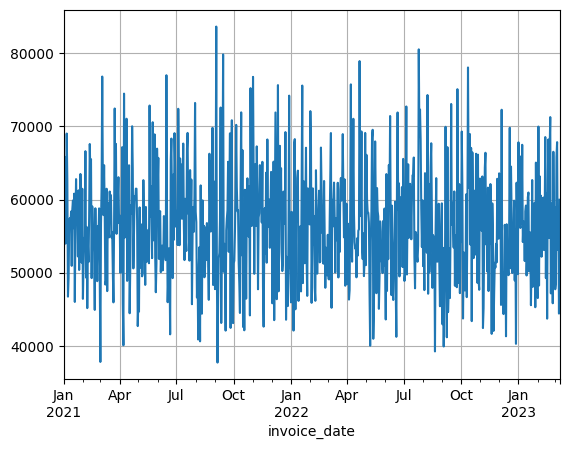

In [69]:
df.groupby('invoice_date')['price'].sum().plot(kind='line')
plt.grid()
plt.show()

In [70]:
date = pd.DataFrame(df.groupby('invoice_date')['price'].sum())


In [71]:
lim='2022-09-01'


In [72]:
train=date[date.index<=lim]
train.head()

,price
invoice_date,
2021-01-01,40468.76
2021-01-02,62604.16
2021-01-03,65839.59
2021-01-04,53971.68
2021-01-05,57799.89


In [73]:
test=date[date.index>lim]
test.head()

,price
invoice_date,
2022-09-02,53400.35
2022-09-03,39917.75
2022-09-04,48076.56
2022-09-05,49040.09
2022-09-06,69944.90


In [74]:
xtrain = train.index
ytrain = train['price']

In [75]:
xtest = test.index
ytest = test['price']

In [76]:
from sklearn.linear_model import LinearRegression


In [77]:
lr = LinearRegression()
lr_model = lr.fit(xtrain.values.reshape(-1,1),ytrain)

In [78]:
xtest

DatetimeIndex(['2022-09-02', '2022-09-03', '2022-09-04', '2022-09-05',
               '2022-09-06', '2022-09-07', '2022-09-08', '2022-09-09',
               '2022-09-10', '2022-09-11',
               ...
               '2023-02-27', '2023-02-28', '2023-03-01', '2023-03-02',
               '2023-03-03', '2023-03-04', '2023-03-05', '2023-03-06',
               '2023-03-07', '2023-03-08'],
              dtype='datetime64[ns]', name='invoice_date', length=188, freq=None)

In [79]:
ypred = lr_model.predict(xtest.values.astype('float').reshape(-1,1))
ypred

array([56590.85613371, 56590.72478867, 56590.59344363, 56590.46209859,
       56590.33075354, 56590.1994085 , 56590.06806346, 56589.93671842,
       56589.80537338, 56589.67402834, 56589.5426833 , 56589.41133826,
       56589.27999322, 56589.14864818, 56589.01730314, 56588.8859581 ,
       56588.75461306, 56588.62326802, 56588.49192298, 56588.36057794,
       56588.22923289, 56588.09788785, 56587.96654281, 56587.83519777,
       56587.70385273, 56587.57250769, 56587.44116265, 56587.30981761,
       56587.17847257, 56587.04712753, 56586.91578249, 56586.78443745,
       56586.65309241, 56586.52174737, 56586.39040233, 56586.25905728,
       56586.12771224, 56585.9963672 , 56585.86502216, 56585.73367712,
       56585.60233208, 56585.47098704, 56585.339642  , 56585.20829696,
       56585.07695192, 56584.94560688, 56584.81426184, 56584.6829168 ,
       56584.55157176, 56584.42022672, 56584.28888168, 56584.15753663,
       56584.02619159, 56583.89484655, 56583.76350151, 56583.63215647,
      

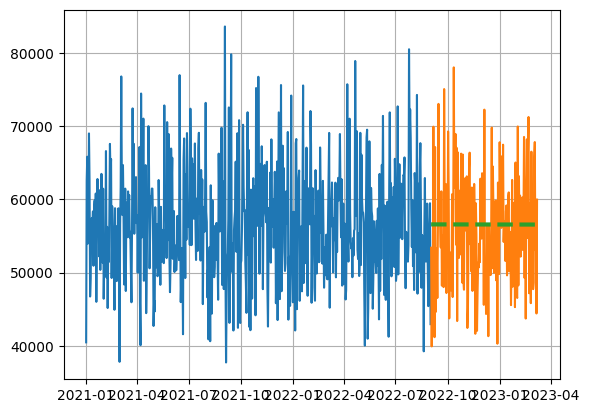

In [80]:
plt.plot(xtrain,ytrain)
plt.plot(xtest,ytest)
plt.plot(xtest,ypred,linewidth=3,linestyle='--')
plt.grid()
plt.show()


In [81]:
from statsmodels.tsa.stattools import adfuller


result = adfuller(date['price'])  # Replace 'column_name' with the name of your data column

# Extract and print the results
adf_statistic = result[0]
p_value = result[1]
critical_values = result[4]

print(f'ADF Statistic: {adf_statistic}')
print(f'p-value: {p_value}')
print('Critical Values:')

ADF Statistic: -28.154123369880445
p-value: 0.0
Critical Values:


In [82]:
from statsmodels.tsa.arima.model import ARIMA


In [83]:
model = ARIMA(test,order=(1,1,1))
result = model.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



In [84]:
forecast = result.get_forecast(steps=ytest.shape[0])  # Forecast the next 10 time steps
forecast.summary_frame()

price,mean,mean_se,mean_ci_lower,mean_ci_upper
2023-03-09,56402.979263,8386.474167,39965.791937,72840.166588
2023-03-10,56824.627443,8387.846403,40384.750584,73264.504301
2023-03-11,56774.894685,8431.345613,40249.760943,73300.028427
2023-03-12,56780.760587,8463.457893,40192.687932,73368.833243
2023-03-13,56780.068713,8496.674955,40126.891813,73433.245613
...,...,...,...,...
2023-09-08,56780.141709,13139.213582,31027.756303,82532.527115
2023-09-09,56780.141709,13160.550240,30985.937222,82574.346196
2023-09-10,56780.141709,13181.852361,30944.185831,82616.097586
2023-09-11,56780.141709,13203.120114,30902.501803,82657.781615


In [85]:
mean = forecast.summary_frame()['mean']
mean_lower = forecast.summary_frame()['mean_ci_lower']
mean_upper = forecast.summary_frame()['mean_ci_upper']
mean_se = forecast.summary_frame()['mean_se']


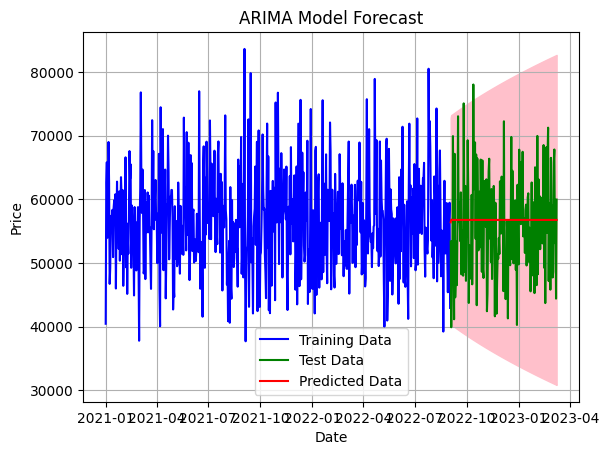

In [86]:
#Plot the forecast

import matplotlib.pyplot as plt
plt.plot(xtrain, ytrain, label="Training Data", color='blue')
plt.plot(xtest, ytest, label="Test Data", color='green')
plt.plot(xtest, mean, label="Predicted Data", color='red')
plt.fill_between(xtest, mean_lower, mean_upper, color='pink')
plt.xlabel("Date")
plt.ylabel("Price")
plt.title("ARIMA Model Forecast")
plt.legend()
plt.grid(True)
plt.show()


In [87]:
# Conclusions

#- The most profitable items are in the "Electronics" and "Clothing" categories.
#- The most profitable malls are "Grand Indonesia" and "Plaza Senayan".
#- Male customers tend to spend more on "Electronics" and "Sports" items, while female customers tend to spend more on "Clothing" and "Accessories" items.
#- The most common payment method is "Cash".
#- The most profitable age group is "25-34" for both male and female customers.
#- There is a positive trend in sales over time.
#- The ARIMA model provides a reasonable forecast for future sales.

# Recommendations

#- Focus on promoting and expanding the sales of the most profitable items in the most profitable malls.
#- Target marketing campaigns to specific customer segments based on their gender and age.
#- Encourage the use of cash payments by offering discounts or other incentives.
#- Continue to monitor sales trends and adjust strategies accordingly.
#- Use the ARIMA model to forecast future sales and make informed business decisions.
